Сначала подключим модуль thinkdsp.py

In [2]:
# Get thinkdsp.py

import os

if not os.path.exists('thinkdsp.py'):
    !wget https://github.com/AllenDowney/ThinkDSP/raw/master/code/thinkdsp.py

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import math

from thinkdsp import decorate
from thinkdsp import Chirp
from thinkdsp import normalize, unbias
from thinkdsp import read_wave

PI2 = math.pi * 2

## УПРАЖНЕНИЕ 3.2

Необходимо написать класс SawtoothChirp с методом evaluate, для генерации пилообразного сигнала с линейно увеличивающейся или уменьшающейся частотой.

Код класса представлен ниже:

In [4]:
class SawtoothChirp(Chirp):
    def evaluate(self, ts):
        ts = np.asarray(ts)
        freqs = np.linspace(self.start, self.end, len(ts)) 
        dts = np.diff(ts, append=ts[-1])
        dphis = PI2 * freqs * dts
        phases = np.cumsum(dphis)
        cycles = phases/PI2
        frac, _ = np.modf(cycles)
        ys = normalize(unbias(frac), self.amp)
        return ys

Теперь создадим сигнал и получим wave:

In [5]:
signal = SawtoothChirp(start=220, end=880)
wave = signal.make_wave(duration=1, framerate=5000)

Прослушаем его:

In [6]:
wave.make_audio()

Из-за эфекта биений мы слышим искажения звука.

Распечатаем спектрограмму сигнала:

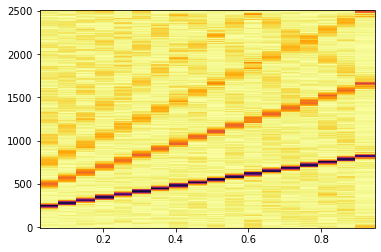

In [7]:
spectrogram = wave.make_spectrogram(512)
spectrogram.plot()

На спектрограмме мы можем видеть наложение гармоник.

## УПРАЖНЕНИЕ 3.3

В этом упражнении необходимо создать пилообразный чирп (от 2500 до 3000) и сгенерировать сигнал (длительность - 1с, частота кадров - 20 кГц). Построить спектр.

In [8]:
signal = SawtoothChirp(start=2500, end=3000)
wave = signal.make_wave(duration=1, framerate=20000)

Теперь распечатаем спектр сигнала:

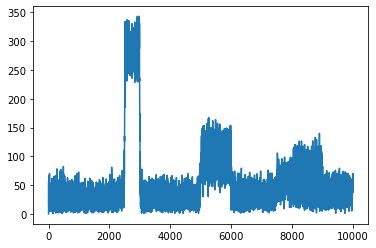

In [9]:
spectrum = wave.make_spectrum()
spectrum.plot()

Прослушаем сигнал:

In [10]:
wave.make_audio()

## УПРАЖНЕНИЕ 3.4

В данном упражнении необходимо распечатать спектрограмму первых нескольких секунд звука глиссандо. Источник, с которого загружен звук: https://lightaudio.ru/mp3/глиссандо

In [11]:
wave = read_wave('Аудио к фото 2 — Фортепиано. Глиссандо.wav')
wave.make_audio()

Распечатаем спектрограмму:

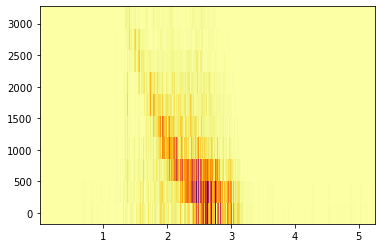

In [12]:
spectrogram = wave.make_spectrogram(128)
spectrogram.plot(high=3500)

## УПРАЖНЕНИЕ 3.5

В данном упражнении необходимо написать класс TromboneGliss, расширяющий чирп и предоставляющий evaluate. Создать сигнал, имитирующий глиссандо на тромбоне от C3 до F3 и обратно.

Код класса представлен ниже:

In [13]:
class TromboneGliss(Chirp):
    def evaluate(self, ts):
        ts = np.asarray(ts)
        lengths = np.linspace(1/self.start, 1/self.end, len(ts))
        freqs = 1/lengths
        dts = np.diff(ts, append=ts[-1])
        dphis = PI2 * freqs * dts
        phases = np.cumsum(dphis)
        ys = self.amp * np.cos(phases)
        return ys

Первая часть сигнала (от C3 до F3):

In [14]:
signal = TromboneGliss(262, 349)
wave1 = signal.make_wave(duration=1)
wave1.make_audio()

Вторая часть сигнала (от F3 до C3):

In [15]:
signal = TromboneGliss(349, 262)
wave2 = signal.make_wave(duration=1)
wave2.make_audio()

Объединим полученные сигналы:

In [16]:
wave = wave1 | wave2
wave.make_audio()

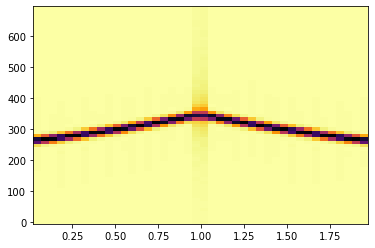

In [17]:
spectrogram = wave.make_spectrogram(1024)
spectrogram.plot(high=700)

Мы можем видеть, что глиссандо на тромбоне больше похоже на экспоненциальный чирп.

## УПРАЖНЕНИЕ 3.6

В данном упражнении необходимо найти запись серии гласных звуков и распечатать спектрограмму.

In [115]:
wave = read_wave('Чжан Ин — Основные гласные звуки.wav')
wave.make_audio()

In [116]:
segment = wave.segment(start=5, duration=16)
segment.make_audio()

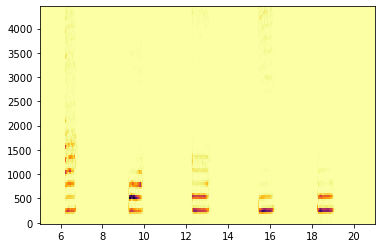

In [117]:
spectrogram = segment.make_spectrogram(1024)
spectrogram.plot(high=4500)

Построим спектр для звука 'а'

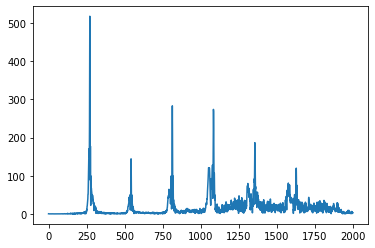

In [118]:
interval = segment.segment(start=6, duration=1)
spectrum = interval.make_spectrum()
spectrum.plot(high=2000)

In [119]:
interval.make_audio()

2 и 3 пики примерно на 800 и 1080 Гц, что практически соответствует формантам гласной 'а' (700 и 1080)

Построим спектр для звука 'о'

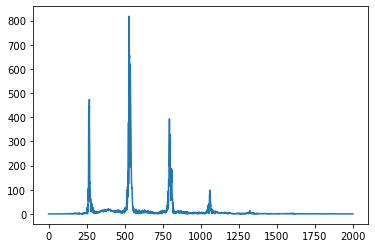

In [120]:
interval = segment.segment(start=9.25, duration=1)
spectrum = interval.make_spectrum()
spectrum.plot(high=2000)

In [121]:
interval.make_audio()

Пики примерно на 535 и 780 что соответствует формантам гласной 'о'

Построим спектр для звука 'ы'

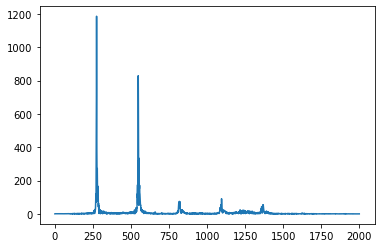

In [122]:
interval = segment.segment(start=12, duration=1.1)
spectrum = interval.make_spectrum()
spectrum.plot(high=2000)

In [123]:
interval.make_audio()

Пики примерно на 540 и 1100. Данные частоты не подходят под форманты гласной 'ы' (300 и 1480), но и звук на записи тоже достаточно сильно отличается от этой гласной.

Построим спектр для звука 'и'

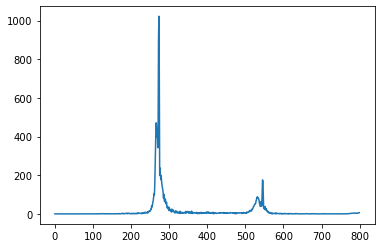

In [130]:
interval = segment.segment(start=15.25, duration=1)
spectrum = interval.make_spectrum()
spectrum.plot(high=800)

In [125]:
interval.make_audio()

Пики примерно на 270 и 550 Гц, первая частота близка к форманте гласной 'и' (240 Гц), вторая частота - нет (2250 Гц).

Построим спектр для звука 'у'

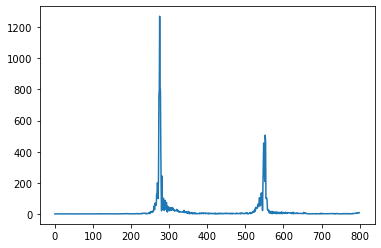

In [131]:
interval = segment.segment(start=18.25, duration=1)
spectrum = interval.make_spectrum()
spectrum.plot(high=800)

In [108]:
interval.make_audio()

Пики примерно на 280 и 560 Гц, первая частота практически соответствует форманте гласной 'у' (300 Гц), вторая частота также относительно близка к форманте 'у' (625 Гц).